# Problem Statement

    #lack of data and customer securities.
    #delay servicses and User negative feedback. 
   
#  Success Criteria*
 
 *Business Success Criteria*: on-time delivery and reduce delays for maximum customer satisfaction.

 *ML Success Criteria*: Minimize shipment delays and improve on-time deliveries using machine learning.

 *Economic Success Criteria*: "Minimize operational costs while maximizing on-time deliveries and customer satisfaction."
  
# Data Collection

# Data:
    obtained from Project Instructor.


# Description:
    Explanation of the Columns in Data set:

Year: The Year the data was collected

Month: The Month in which the data was collected

DayofMonth: The day of the month

DayofWeek: The day of Week

Actual_Shipment_Time: The Actual time when the package was sent for shipment. (ex: 1955 means 19 hours and 55 minutes i.e 7:55 PM)

Planned_Shipment_Time: The time when the package should have been sent for shipment. (ex: 1955 means 19 hours and 55 minutes i.e 7:55 PM)

Planned_Delivery_Time: The time when the package should be delivered. (ex: 1955 means 19 hours and 55 minutes i.e 7:55 PM)

Carrier_Name: The name of the Carrier which carried the package.

Carrier_Num: The number of the Carrier which carried the package.

Planned_TimeofTravel: The estimated time to reach from Source to Destination. ( in minutes)

Shipment_Delay: The time by which the package was shipped late. (in minutes. Negative value indicates that the package was 

shipped early. Ex: 4 indicates that the package was shipped 4 minutes late, whereas, -4 indicates that the package was shipped 4 minutes early)

Source: The place from which the package was shipped.

Destination: The place at which the package was delivered.

Distance: Distance between Source and Destination in miles.

Delivery_Status: Whether it got delivered at right time or not. (Dependent Variable)


Requirements:
    To execute this project, we'll use the following tools and libraries:

# Python Environment:
      We will use the JUPYTER environment.
      
      Libraries IMPORTED
          import numpy as np
          import matplotlib.pyplot as plt
          import pandas as pd
          import seaborn as sns
          import sklearn as preprocessing




In [4]:
# importing Required libraries

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import sklearn as preprocessing 
from sklearn.impute import SimpleImputer

In [5]:
# read th dataset 
data = pd.read_csv(r"A:\class is started\EDA\project wrk\Dataset-20230916T144431Z-001\Dataset\fedex\fedex.csv")
data

,Year,Month,DayofMonth,DayOfWeek,Actual_Shipment_Time,Planned_Shipment_Time,Planned_Delivery_Time,Carrier_Name,Carrier_Num,Planned_TimeofTravel,Shipment_Delay,Source,Destination,Distance,Delivery_Status
0,2008,1,3,4,2003.0,1955,2225,WN,335,150.0,8.0,IAD,TPA,810,0.0
1,2008,1,3,4,754.0,735,1000,WN,3231,145.0,19.0,IAD,TPA,810,1.0
2,2008,1,3,4,628.0,620,750,WN,448,90.0,8.0,IND,BWI,515,0.0
3,2008,1,3,4,926.0,930,1100,WN,1746,90.0,-4.0,IND,BWI,515,0.0
4,2008,1,3,4,1829.0,1755,1925,WN,3920,90.0,34.0,IND,BWI,515,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3604170,2008,6,19,4,1059.0,1100,1256,DL,1547,236.0,-1.0,ATL,JAC,1572,0.0
3604171,2008,6,19,4,555.0,600,738,DL,1548,98.0,-5.0,RSW,ATL,515,0.0
3604172,2008,6,19,4,821.0,827,1003,DL,1548,96.0,-6.0,ATL,IND,432,0.0
3604173,2008,6,19,4,718.0,735,852,DL,1551,77.0,-17.0,CAE,ATL,191,0.0


In [6]:
data.dtypes #used for see the datatype of all table columns

Year                       int64
Month                      int64
DayofMonth                 int64
DayOfWeek                  int64
Actual_Shipment_Time     float64
Planned_Shipment_Time      int64
Planned_Delivery_Time      int64
Carrier_Name              object
Carrier_Num                int64
Planned_TimeofTravel     float64
Shipment_Delay           float64
Source                    object
Destination               object
Distance                   int64
Delivery_Status          float64
dtype: object

In [8]:
## Data Cleaning & Organizing; ##

#Type Casting

data.Actual_Shipment_Time = data.Actual_Shipment_Time.astype('str')
data.dtypes


Year                       int64
Month                      int64
DayofMonth                 int64
DayOfWeek                  int64
Actual_Shipment_Time      object
Planned_Shipment_Time      int64
Planned_Delivery_Time      int64
Carrier_Name              object
Carrier_Num                int64
Planned_TimeofTravel     float64
Shipment_Delay           float64
Source                    object
Destination               object
Distance                   int64
Delivery_Status          float64
dtype: object

In [9]:
data.Actual_Shipment_Time = data.Actual_Shipment_Time.astype('float64')
data.dtypes


Year                       int64
Month                      int64
DayofMonth                 int64
DayOfWeek                  int64
Actual_Shipment_Time     float64
Planned_Shipment_Time      int64
Planned_Delivery_Time      int64
Carrier_Name              object
Carrier_Num                int64
Planned_TimeofTravel     float64
Shipment_Delay           float64
Source                    object
Destination               object
Distance                   int64
Delivery_Status          float64
dtype: object

In [11]:
duplicate = data.duplicated() #Used to see Duplicate values in data set.
duplicate

0          False
1          False
2          False
3          False
4          False
           ...  
3604170    False
3604171    False
3604172    False
3604173    False
3604174    False
Length: 3604175, dtype: bool

In [28]:
#Finding Duplicate values in whole data set.
sum(duplicate) # (it shows the sum of the duplicated value)

duplicate = data.duplicated(keep ='last')
duplicate

0          False
1          False
2          False
3          False
4          False
           ...  
3604170    False
3604171    False
3604172    False
3604173    False
3604174    False
Length: 3604175, dtype: bool

In [12]:
data2 = data.drop_duplicates() #Delete the duplicate values
data2
sum(duplicate)

4

In [30]:
#Used to find null values in dataset.
data.isnull().sum().sum() #the null value present in whole data set


245353

In [13]:
#mean()imputation used for fill up the null values.
data.Actual_Shipment_Time.isna().sum()
mean_imputer = SimpleImputer(missing_values = np.nan, strategy = 'mean')    
data["Actual_Shipment_Time"] = pd.DataFrame(mean_imputer.fit_transform(data[['Actual_Shipment_Time']])) #here by using mean imputer method the null values in specific comlumn are filld up.  
data['Actual_Shipment_Time'].isna().sum()

0

In [14]:
data.Planned_Shipment_Time.isna().sum()   #mean()imputation used for fill up the null values.
mean_imputer = SimpleImputer(missing_values = np.nan, strategy = 'mean')    
data["Planned_TimeofTravel"] = pd.DataFrame(mean_imputer.fit_transform(data[['Planned_TimeofTravel']]))
data['Planned_TimeofTravel'].isna().sum()
data.isnull().sum()


Year                         0
Month                        0
DayofMonth                   0
DayOfWeek                    0
Actual_Shipment_Time         0
Planned_Shipment_Time        0
Planned_Delivery_Time        0
Carrier_Name                 0
Carrier_Num                  0
Planned_TimeofTravel         0
Shipment_Delay           81602
Source                       0
Destination                  0
Distance                     0
Delivery_Status          81602
dtype: int64

In [16]:
#imputer using mean
data.Planned_Delivery_Time.isna().sum()
mean_imputer = SimpleImputer(missing_values = np.nan, strategy = 'mean')    
data["Shipment_Delay"] = pd.DataFrame(mean_imputer.fit_transform(data[['Shipment_Delay']]))
data['Shipment_Delay'].isna().sum()
data.isnull().sum()


Year                     0
Month                    0
DayofMonth               0
DayOfWeek                0
Actual_Shipment_Time     0
Planned_Shipment_Time    0
Planned_Delivery_Time    0
Carrier_Name             0
Carrier_Num              0
Planned_TimeofTravel     0
Shipment_Delay           0
Source                   0
Destination              0
Distance                 0
Delivery_Status          0
dtype: int64

In [80]:
#Random Imputer
from feature_engine.imputation import RandomSampleImputer

random_imputer = RandomSampleImputer(['Planned_TimeofTravel'])
data["Planned_TimeofTravel"] = pd.DataFrame(random_imputer.fit_transform(data[["Planned_TimeofTravel"]]))
data["Planned_TimeofTravel"].isna().sum()  # all records replaced by median

0

In [17]:
data.Planned_Delivery_Time.isna().sum()    #mean()imputation used for fill up the null values.
mean_imputer = SimpleImputer(missing_values = np.nan, strategy = 'mean')    
data["Delivery_Status"] = pd.DataFrame(mean_imputer.fit_transform(data[['Delivery_Status']]))
data['Delivery_Status'].isna().sum()
data.isnull().sum()

Year                     0
Month                    0
DayofMonth               0
DayOfWeek                0
Actual_Shipment_Time     0
Planned_Shipment_Time    0
Planned_Delivery_Time    0
Carrier_Name             0
Carrier_Num              0
Planned_TimeofTravel     0
Shipment_Delay           0
Source                   0
Destination              0
Distance                 0
Delivery_Status          0
dtype: int64

In [18]:
data.Actual_Shipment_Time = data.Actual_Shipment_Time.astype('int64') .
data.dtypes
#here after adjusting the null values in dataset we can typecast the required column.


Year                       int64
Month                      int64
DayofMonth                 int64
DayOfWeek                  int64
Actual_Shipment_Time       int64
Planned_Shipment_Time      int64
Planned_Delivery_Time      int64
Carrier_Name              object
Carrier_Num                int64
Planned_TimeofTravel     float64
Shipment_Delay           float64
Source                    object
Destination               object
Distance                   int64
Delivery_Status          float64
dtype: object

In [ ]:
#

In [23]:
IQR = data2['Shipment_Delay'].quantile(0.75) - data2['Shipment_Delay'].quantile(0.25)
lower_limit = data2['Shipment_Delay'].quantile(0.25) - (IQR * 1.5)
upper_limit = data2['Shipment_Delay'].quantile(0.75) + (IQR * 1.5)

In [25]:
lower_limit


-25.0

In [26]:
upper_limit


31.0

In [27]:
IQR

14.0

C:\Users\SHIVAJI PATIL\AppData\Local\Temp\ipykernel_19512\1624122756.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2['Shipment_Delay'] = pd.DataFrame(np.where(data2['Shipment_Delay'] > upper_limit, upper_limit, np.where(data2['Shipment_Delay'] < lower_limit, lower_limit, data2['Shipment_Delay'])))


<Axes: >

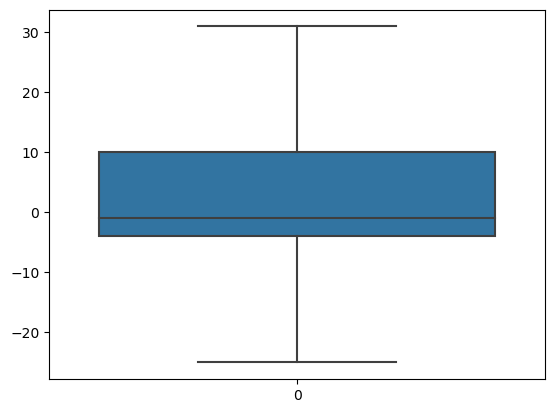

In [28]:
#Replace#
### Replace the outliers by the maximum and minimum limit##
data2['Shipment_Delay'] = pd.DataFrame(np.where(data2['Shipment_Delay'] > upper_limit, upper_limit, np.where(data2['Shipment_Delay'] < lower_limit, lower_limit, data2['Shipment_Delay'])))
sns.boxplot(data2.Shipment_Delay)

<Axes: >

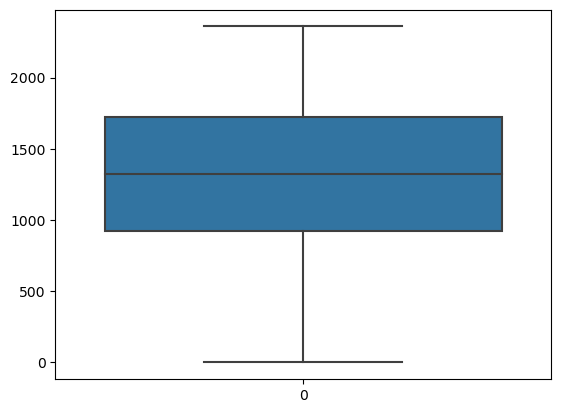

In [36]:
sns.boxplot(data2.Planned_Shipment_Time)  

<Axes: >

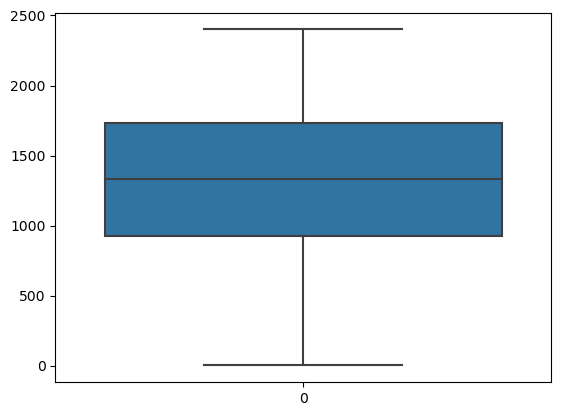

In [37]:
sns.boxplot(data2.Actual_Shipment_Time)  

<Axes: >

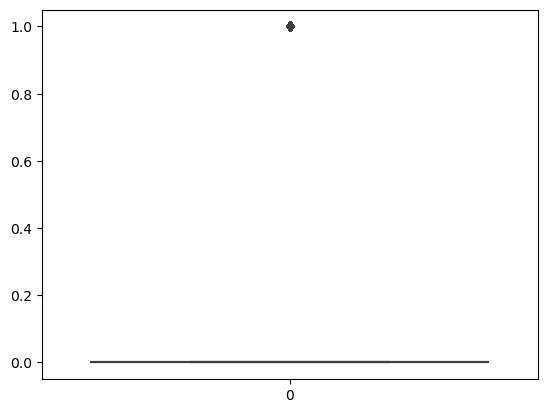

In [38]:
sns.boxplot(data2.Delivery_Status)  

<Axes: >

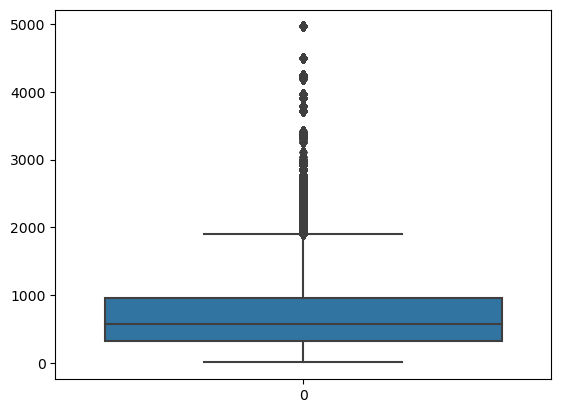

In [39]:
sns.boxplot(data2.Distance) 

In [30]:
from feature_engine.outliers import Winsorizer

<Axes: >

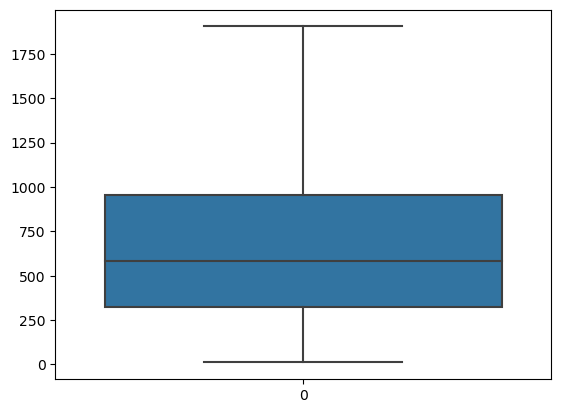

In [32]:
##  Winsorization ##
winsor_iqr = Winsorizer(capping_method = 'iqr', 
                        # choose  IQR rule boundaries or gaussian for mean and std
                          tail = 'both', # cap left, right or both tails 
                          fold = 1.5, 
                          variables = ['Distance'])

df_s = winsor_iqr.fit_transform(data2[['Distance']])

# Inspect the minimum caps and maximum caps
# winsor.left_tail_caps_, winsor.right_tail_caps_

# Let's see boxplot
sns.boxplot(df_s.Distance)

<Axes: >

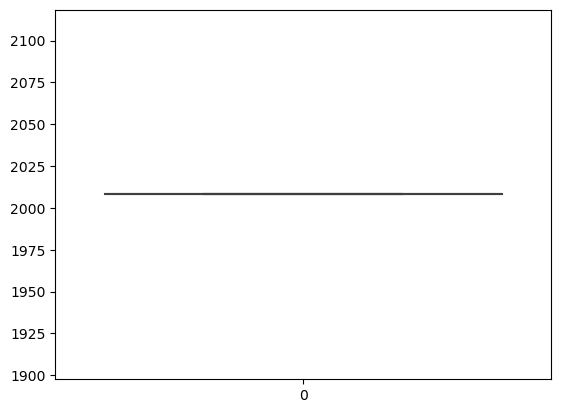

In [40]:
sns.boxplot(data2.Year)

<Axes: >

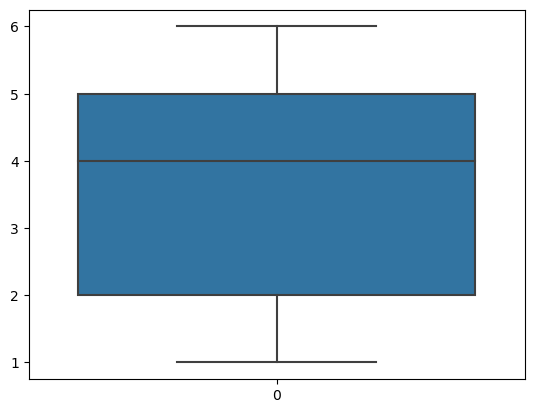

In [41]:
sns.boxplot(data2.Month) 

<Axes: >

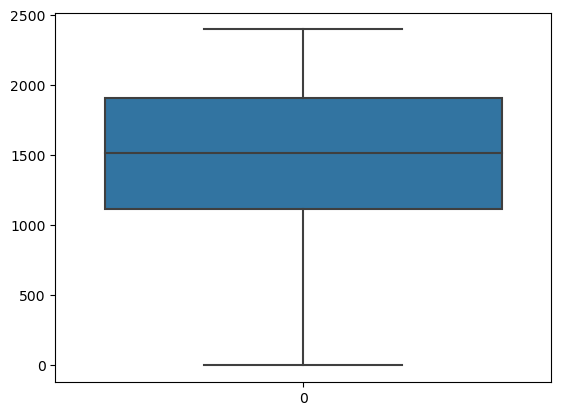

In [42]:
sns.boxplot(data2.Planned_Delivery_Time) 

<Axes: >

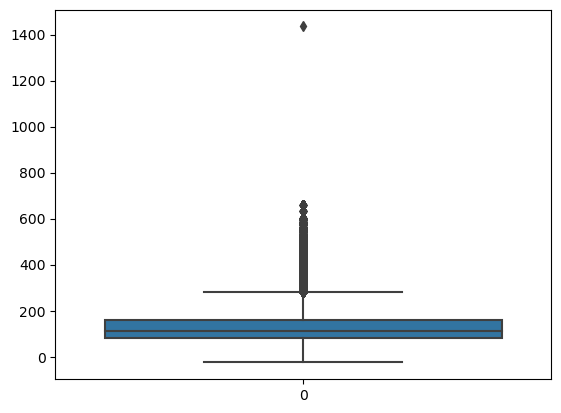

In [33]:
sns.boxplot(data2.Planned_TimeofTravel) 

<Axes: >

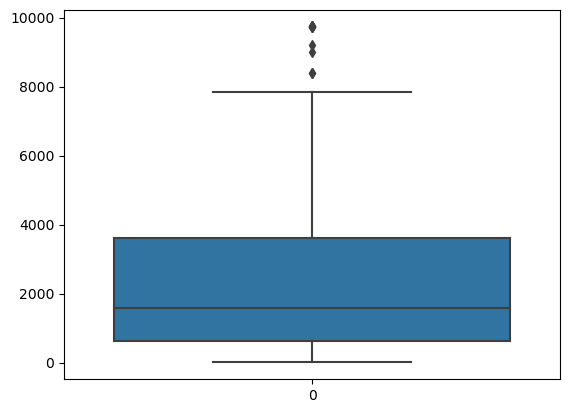

In [36]:
sns.boxplot(data2.Carrier_Num) 

In [ ]:
# Defining the above data Gaussian method #

<Axes: >

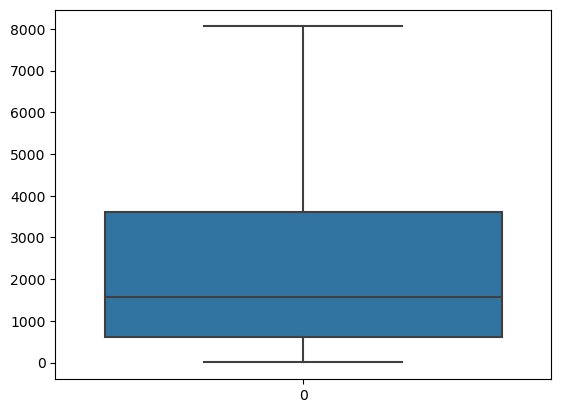

In [34]:
##Winsorization using Gaussian method ##
winsor_gaussian = Winsorizer(capping_method = 'gaussian', 
                             # choose IQR rule boundaries or gaussian for mean and std
                          tail = 'both', # cap left, right or both tails 
                          fold = 3,
                          variables = ['Carrier_Num'])

df_t = winsor_gaussian.fit_transform(data2[['Carrier_Num']])
sns.boxplot(df_t.Carrier_Num)

In [22]:
pip install feature-engine

Note: you may need to restart the kernel to use updated packages.


<Axes: >

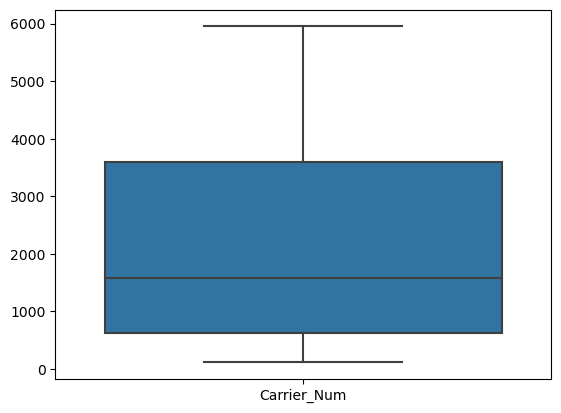

In [38]:

from feature_engine.outliers import Winsorizer
winsor_percentile = Winsorizer(capping_method = 'quantiles',
                          tail = 'both', # cap left, right or both tails 
                          fold = 0.05, # limits will be the 5th and 95th percentiles
                          variables = ['Carrier_Num'])

data2 = winsor_percentile.fit_transform(data2[['Carrier_Num']])
sns.boxplot(data2)

In [39]:
## Discretization

In [43]:
#import pandas as pd
#data = pd.read_csv(r"C:/Data/ethnic diversity.csv")
data.head()
data.tail()
data.info()
data.describe()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3604175 entries, 0 to 3604174
Data columns (total 15 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Year                   int64  
 1   Month                  int64  
 2   DayofMonth             int64  
 3   DayOfWeek              int64  
 4   Actual_Shipment_Time   int64  
 5   Planned_Shipment_Time  int64  
 6   Planned_Delivery_Time  int64  
 7   Carrier_Name           object 
 8   Carrier_Num            int64  
 9   Planned_TimeofTravel   float64
 10  Shipment_Delay         float64
 11  Source                 object 
 12  Destination            object 
 13  Distance               int64  
 14  Delivery_Status        float64
dtypes: float64(3), int64(9), object(3)
memory usage: 412.5+ MB


,Year,Month,DayofMonth,DayOfWeek,Actual_Shipment_Time,Planned_Shipment_Time,Planned_Delivery_Time,Carrier_Num,Planned_TimeofTravel,Shipment_Delay,Distance,Delivery_Status
count,3604175.0,3.604175e+06,3.604175e+06,3.604175e+06,3.604175e+06,3.604175e+06,3.604175e+06,3.604175e+06,3.604175e+06,3.604175e+06,3.604175e+06,3.604175e+06
mean,2008.0,3.514942e+00,1.568481e+01,3.934604e+00,1.338444e+03,1.329371e+03,1.495305e+03,2.223795e+03,1.291603e+02,1.115893e+01,7.280915e+02,2.038890e-01
std,0.0,1.709912e+00,8.763332e+00,1.987126e+00,4.759243e+02,4.664365e+02,4.854825e+02,1.944583e+03,6.950484e+01,3.577686e+01,5.611318e+02,3.983005e-01
min,2008.0,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,-2.500000e+01,-9.200000e+01,1.100000e+01,0.000000e+00
25%,2008.0,2.000000e+00,8.000000e+00,2.000000e+00,9.340000e+02,9.250000e+02,1.115000e+03,6.160000e+02,8.000000e+01,-4.000000e+00,3.250000e+02,0.000000e+00
50%,2008.0,4.000000e+00,1.600000e+01,4.000000e+00,1.338000e+03,1.321000e+03,1.519000e+03,1.573000e+03,1.110000e+02,0.000000e+00,5.830000e+02,0.000000e+00
75%,2008.0,5.000000e+00,2.300000e+01,6.000000e+00,1.727000e+03,1.720000e+03,1.910000e+03,3.602000e+03,1.600000e+02,1.115893e+01,9.570000e+02,0.000000e+00
max,2008.0,6.000000e+00,3.100000e+01,7.000000e+00,2.400000e+03,2.359000e+03,2.400000e+03,9.741000e+03,1.435000e+03,2.467000e+03,4.962000e+03,1.000000e+00


In [41]:
## Binarization

In [45]:
data['Delivery_Status_new'] = pd.cut(data['Delivery_Status'], 
                              bins = [min(data.Delivery_Status), data.Delivery_Status.mean(), max(data.Delivery_Status)],
                              labels = ["Low", "High"])

# Look out for the break up of the categories.
data.Delivery_Status_new.value_counts()




High    718214
Low      81602
Name: Delivery_Status_new, dtype: int64

In [46]:
data['Delivery_Status_new1'] = pd.cut(data['Delivery_Status'], 
                              bins = [min(data.Delivery_Status), data.Delivery_Status.mean(), max(data.Delivery_Status)], 
                              include_lowest = True,
                              labels = ["Low", "High"])

data.Delivery_Status_new1.value_counts()


Low     2885961
High     718214
Name: Delivery_Status_new1, dtype: int64

#for bar plot it takes to much time (huge data takes time to processing).

KeyboardInterrupt: 

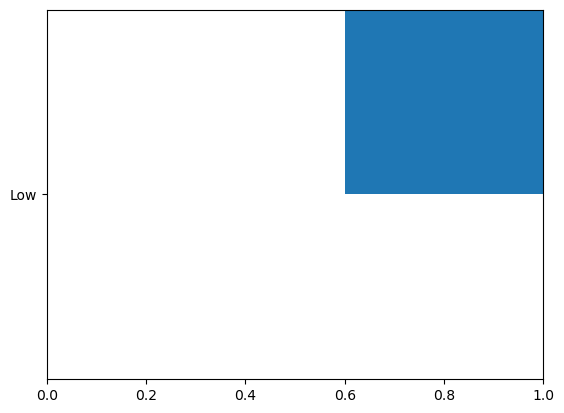

In [49]:
import matplotlib.pyplot as plt

plt.bar(x = range(3604175), height = data.Delivery_Status_new1)
plt.hist(data.Delivery_Status_new1)
plt.boxplot(data.Delivery_Status_new1)

In [51]:
data.columns # column names
data.shape 

(3604175, 17)

In [67]:
  #One hot encoding#


data.drop([ 'Year'], axis = 1, inplace = True)


In [68]:
df_new = pd.get_dummies(data)

df_new_1 = pd.get_dummies(data, drop_first = True)

In [72]:
#data.columns
data = data[[ 'DayofMonth', 'DayOfWeek', 'Actual_Shipment_Time',
       'Planned_Shipment_Time', 'Planned_Delivery_Time', 'Carrier_Name',
       'Carrier_Num', 'Planned_TimeofTravel', 'Shipment_Delay', 'Source',
       'Destination', 'Distance', 'Delivery_Status', 'Delivery_Status_new',
       'Delivery_Status_new1']]

a = data['Actual_Shipment_Time']
b = data[['Actual_Shipment_Time']]





In [73]:
data.columns #used for see columns in dataset

Index(['DayofMonth', 'DayOfWeek', 'Actual_Shipment_Time',
       'Planned_Shipment_Time', 'Planned_Delivery_Time', 'Carrier_Name',
       'Carrier_Num', 'Planned_TimeofTravel', 'Shipment_Delay', 'Source',
       'Destination', 'Distance', 'Delivery_Status', 'Delivery_Status_new',
       'Delivery_Status_new1'],
      dtype='object')

In [ ]:
from sklearn.preprocessing import OneHotEncoder
# Creating instance of One-Hot Encoder
enc = OneHotEncoder() # initializing method

enc_df = pd.DataFrame(enc.fit_transform(data.iloc[:, 2:]).toarray())

In [82]:
import scipy.stats as stats
import pylab

((array([-5.07640862, -4.90513325, -4.81276656, ...,  4.81276656,
          4.90513325,  5.07640862]),
  array([   1,    1,    1, ..., 2400, 2400, 2400], dtype=int64)),
 (469.6113456798421, 1338.4443446835962, 0.9867339220242073))

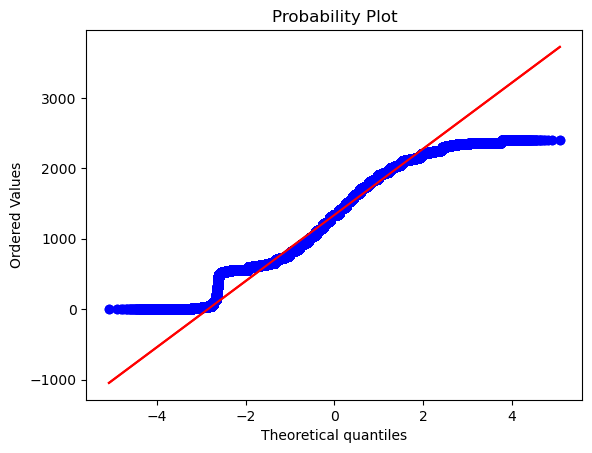

In [83]:
#Transformation
# Normal Quantile-Quantile Plot
stats.probplot(data.Actual_Shipment_Time, dist = "norm", plot = pylab)

stats.probplot(data.Actual_Shipment_Time, dist = "norm", plot = pylab)

((array([-5.07640862, -4.90513325, -4.81276656, ...,  4.81276656,
          4.90513325,  5.07640862]),
  array([0.        , 0.        , 0.        , ..., 7.78322402, 7.78322402,
         7.78322402])),
 (0.4107472361175545, 7.120097297238085, 0.9055273862534365))

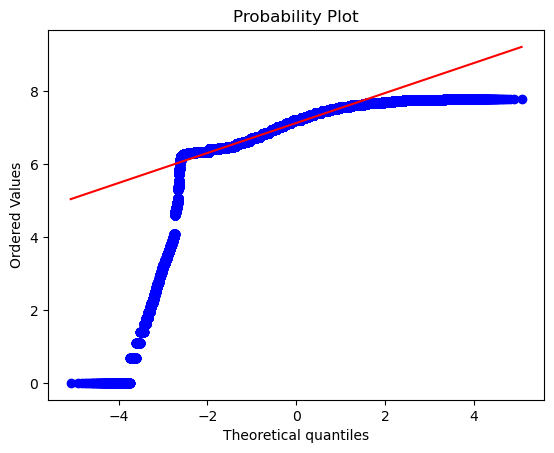

In [84]:
stats.probplot(np.log(data.Actual_Shipment_Time), dist = "norm", plot = pylab)

((array([-5.07640862, -4.90513325, -4.81276656, ...,  4.81276656,
          4.90513325,  5.07640862]),
  array([0.        , 0.        , 0.        , ..., 7.78322402, 7.78322402,
         7.78322402])),
 (0.4107472361175545, 7.120097297238085, 0.9055273862534365))

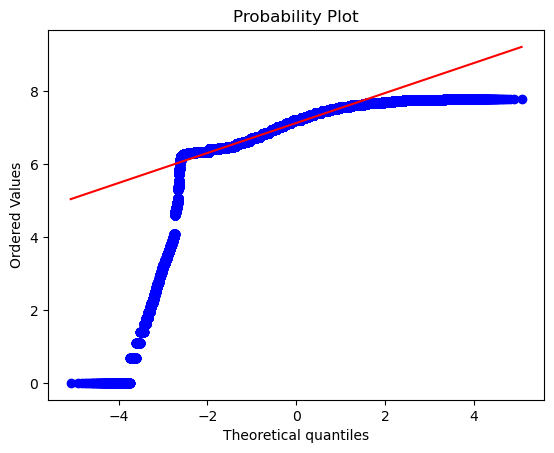

In [85]:
stats.probplot(np.log(data.Actual_Shipment_Time), dist = "norm", plot = pylab)

In [ ]:
import pandas as pd
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
import pylab

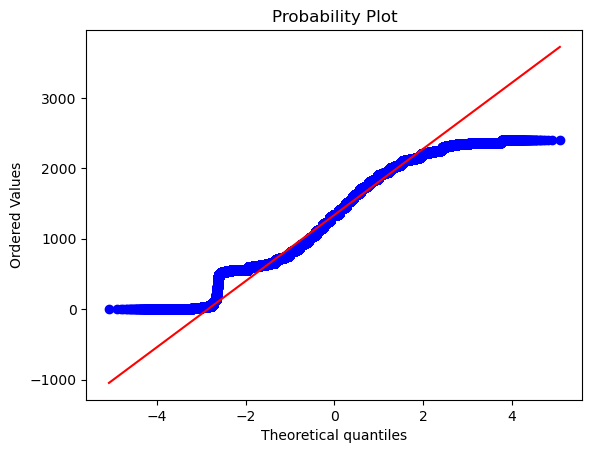

In [86]:
prob = stats.probplot(data.Actual_Shipment_Time, dist = stats.norm, plot = pylab)

C:\Users\SHIVAJI PATIL\AppData\Local\Temp\ipykernel_19512\3295952773.py:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Actual_Shipment_Time_lambda, hist = False, kde = True,
C:\Users\SHIVAJI PATIL\anaconda3\Lib\site-packages\seaborn\distributions.py:2511: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)
C:\Users\SHIVAJI PATIL\anaconda3\Lib\site-packages\seaborn\distributions.py:2511: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singu

<Axes: xlabel='Actual_Shipment_Time', ylabel='Density'>

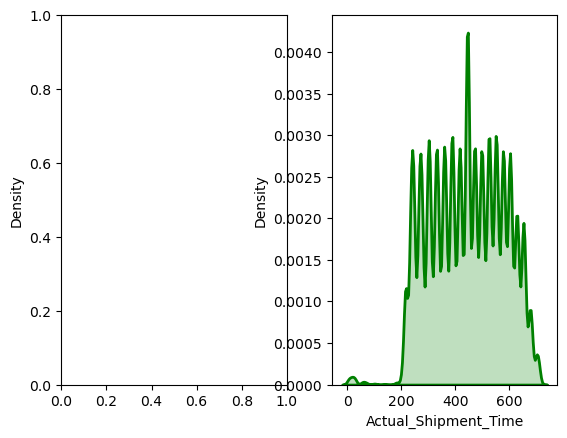

In [87]:
data.Actual_Shipment_Time, data.Actual_Shipment_Time_lambda = stats.boxcox(data.Actual_Shipment_Time)

# creating axes to draw plots
fig, ax = plt.subplots(1, 2)

# Plotting the original data (non-normal) and fitted data (normal)
sns.distplot(data.Actual_Shipment_Time_lambda, hist = False, kde = True,
             kde_kws = {'shade': True, 'linewidth': 2},
             label = "Non-Normal", color = "green", ax = ax[0])

sns.distplot(data.Actual_Shipment_Time, hist = False, kde = True,
             kde_kws = {'shade': True, 'linewidth': 2},
             label = "Normal", color = "green", ax = ax[1])


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


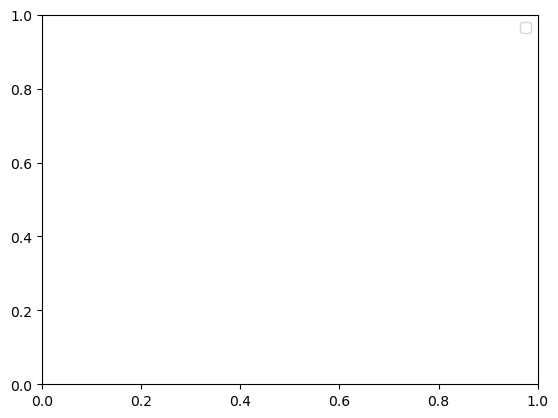

In [88]:
plt.legend(loc = "upper right")

# rescaling the subplots
fig.set_figheight(5)
fig.set_figwidth(10)

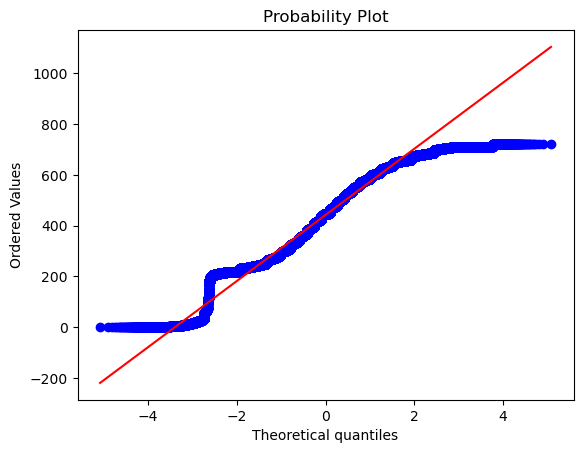

In [90]:
prob = stats.probplot(data.Actual_Shipment_Time, dist = stats.norm, plot = pylab)

In [93]:
# Yeo-Johnson Transform

'''
We can apply it to our dataset without scaling the data.
It supports zero values and negative values. It does not require the values for 
each input variable to be strictly positive. 

In Box-Cox transform the input variable has to be positive.'''

import seaborn as sns
import matplotlib.pyplot as plt
import pylab

In [ ]:
# Yeo-Johnson Transform

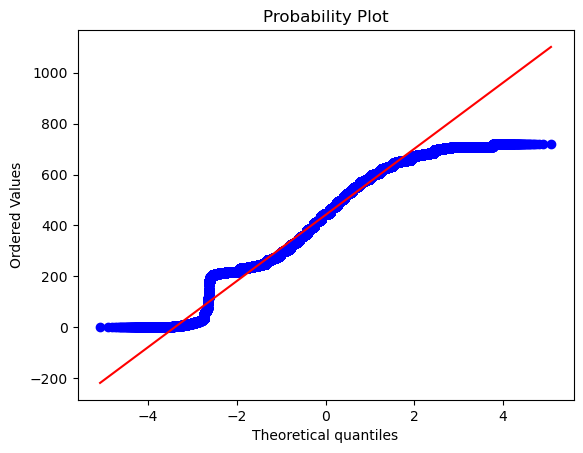

In [96]:
from feature_engine import transformation

# Set up the variable transformer
tf = transformation.YeoJohnsonTransformer(variables = 'Actual_Shipment_Time')

edu_tf = tf.fit_transform(data)

# Transformed data
prob = stats.probplot(edu_tf.Actual_Shipment_Time, dist = stats.norm, plot = pylab)


In [110]:
data1 = pd.read_csv(r"A:\class is started\EDA\project wrk\Dataset-20230916T144431Z-001\Dataset\fedex\fedex.csv")
data1

,Year,Month,DayofMonth,DayOfWeek,Actual_Shipment_Time,Planned_Shipment_Time,Planned_Delivery_Time,Carrier_Name,Carrier_Num,Planned_TimeofTravel,Shipment_Delay,Source,Destination,Distance,Delivery_Status
0,2008,1,3,4,2003.0,1955,2225,WN,335,150.0,8.0,IAD,TPA,810,0.0
1,2008,1,3,4,754.0,735,1000,WN,3231,145.0,19.0,IAD,TPA,810,1.0
2,2008,1,3,4,628.0,620,750,WN,448,90.0,8.0,IND,BWI,515,0.0
3,2008,1,3,4,926.0,930,1100,WN,1746,90.0,-4.0,IND,BWI,515,0.0
4,2008,1,3,4,1829.0,1755,1925,WN,3920,90.0,34.0,IND,BWI,515,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3604170,2008,6,19,4,1059.0,1100,1256,DL,1547,236.0,-1.0,ATL,JAC,1572,0.0
3604171,2008,6,19,4,555.0,600,738,DL,1548,98.0,-5.0,RSW,ATL,515,0.0
3604172,2008,6,19,4,821.0,827,1003,DL,1548,96.0,-6.0,ATL,IND,432,0.0
3604173,2008,6,19,4,718.0,735,852,DL,1551,77.0,-17.0,CAE,ATL,191,0.0


In [112]:
a = data1.describe()

In [114]:
data4 = data1[['Year', 'Month', 'DayofMonth', 'DayOfWeek','Planned_Shipment_Time', 'Planned_Delivery_Time','Carrier_Num','Distance']]

In [115]:
# Initialise the Scaler
scaler = StandardScaler()
# To scale data
data4 = scaler.fit_transform(data4)
# Convert the array back to a dataframe
dataset = pd.DataFrame(data4)
res = dataset.describe()

In [116]:
from sklearn.preprocessing import MinMaxScaler

In [118]:
# Normalization
minmaxscale = MinMaxScaler()

data_n = minmaxscale.fit_transform(data4)
dataset1 = pd.DataFrame(data_n)

res1 = dataset1.describe()


In [119]:
# Get dummies
fedex = pd.get_dummies(data1, drop_first = True)

fedex.describe


<bound method NDFrame.describe of          Year  Month  DayofMonth  DayOfWeek  Actual_Shipment_Time  \
0        2008      1           3          4                2003.0   
1        2008      1           3          4                 754.0   
2        2008      1           3          4                 628.0   
3        2008      1           3          4                 926.0   
4        2008      1           3          4                1829.0   
...       ...    ...         ...        ...                   ...   
3604170  2008      6          19          4                1059.0   
3604171  2008      6          19          4                 555.0   
3604172  2008      6          19          4                 821.0   
3604173  2008      6          19          4                 718.0   
3604174  2008      6          19          4                1127.0   

         Planned_Shipment_Time  Planned_Delivery_Time  Carrier_Num  \
0                         1955                   2225          335 

In [ ]:
### Normalization function - Custom Function
# Range converts to: 0 to 1
def norm_func(i):
    x = (i-i.min())/(i.max()-i.min())
    return(x)

data_norm = norm_func(fedex)
data_norm.describe()

In [ ]:
'''Scale features using statistics that are robust to outliers'''
                                                    #  Robust Scaling
from sklearn.preprocessing import RobustScaler

robust_model = RobustScaler()

data_robust = robust_model.fit_transform(fedex)

dataset_robust = pd.DataFrame(data_robust)
res_robust = dataset_robust.describe()

# First moment Business Decission

In [56]:
data.info()
data.Actual_Shipment_Time.mean()       #mean
data.Actual_Shipment_Time.median()     #median
data.Actual_Shipment_Time.mode()       #mode

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3604175 entries, 0 to 3604174
Data columns (total 15 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Year                   int64  
 1   Month                  int64  
 2   DayofMonth             int64  
 3   DayOfWeek              int64  
 4   Actual_Shipment_Time   float64
 5   Planned_Shipment_Time  int64  
 6   Planned_Delivery_Time  int64  
 7   Carrier_Name           object 
 8   Carrier_Num            int64  
 9   Planned_TimeofTravel   float64
 10  Shipment_Delay         float64
 11  Source                 object 
 12  Destination            object 
 13  Distance               int64  
 14  Delivery_Status        float64
dtypes: float64(4), int64(8), object(3)
memory usage: 412.5+ MB


0    555.0
Name: Actual_Shipment_Time, dtype: float64

In [27]:
data.Planned_Shipment_Time.mean()
data.Planned_Shipment_Time.median()
data.Planned_Shipment_Time.mode()


0    600
Name: Planned_Shipment_Time, dtype: int64

In [28]:
data.Planned_Shipment_Time.mean()
data.Planned_Shipment_Time.median()
data.Planned_Shipment_Time.mode()

0    600
Name: Planned_Shipment_Time, dtype: int64

In [29]:
data.Planned_Delivery_Time.mean()
data.Planned_Delivery_Time.median()
data.Planned_Delivery_Time.mode()

0    1930
Name: Planned_Delivery_Time, dtype: int64

In [30]:
data.Carrier_Num.mean()
data.Carrier_Num.median()
data.Carrier_Num.mode()


0    16
Name: Carrier_Num, dtype: int64

In [31]:
data.Planned_TimeofTravel.mean()
data.Planned_TimeofTravel.median()
data.Planned_TimeofTravel.mode()


0    75.0
Name: Planned_TimeofTravel, dtype: float64

In [32]:
data.Shipment_Delay.mean()
data.Shipment_Delay.median()
data.Shipment_Delay.mode()

0    0.0
Name: Shipment_Delay, dtype: float64

In [33]:
data.Distance.mean()
data.Distance.median()
data.Distance.mode()


0    337
Name: Distance, dtype: int64

In [34]:
data.Delivery_Status.mean()
data.Delivery_Status.median()
data.Delivery_Status.mode()

0    0.0
Name: Delivery_Status, dtype: float64

# Second moment Business Decission

In [35]:
data.Actual_Shipment_Time.var() # variance
data.Actual_Shipment_Time.std() # standard deviation
range = max(data.Actual_Shipment_Time) - min(data.Actual_Shipment_Time) # range
range

2399.0

In [36]:
data.Planned_Shipment_Time.var()
data.Planned_Shipment_Time.std()
range = max(data.Planned_Shipment_Time) - min(data.Planned_Shipment_Time)
range

2359

In [37]:
data.Planned_Delivery_Time.var()
data.Planned_Delivery_Time.std()
range = max(data.Planned_Delivery_Time) - min(data.Planned_Delivery_Time)
range

2400

In [38]:
data.Carrier_Num.var()
data.Carrier_Num.std()
range = max(data.Carrier_Num) - min(data.Carrier_Num)
range

9740

In [39]:
data.Planned_TimeofTravel.var()
data.Planned_TimeofTravel.std()
range = max(data.Planned_TimeofTravel) - min(data.Planned_TimeofTravel)
range

1460.0

In [40]:
data.Shipment_Delay.var()
data.Shipment_Delay.std()
range = max(data.Shipment_Delay) - (data.Shipment_Delay)
range


0          2459.0
1          2448.0
2          2459.0
3          2471.0
4          2433.0
            ...  
3604170    2468.0
3604171    2472.0
3604172    2473.0
3604173    2484.0
3604174    2371.0
Name: Shipment_Delay, Length: 3604175, dtype: float64

In [41]:
data.Distance.var()
data.Distance.std()
range = max(data.Distance) - min(data.Distance)
range

4951

In [42]:
data.Delivery_Status.var()
data.Delivery_Status.std()
range = max(data.Delivery_Status) - min(data.Delivery_Status)
range

1.0

# Third moment Business Decission

In [43]:
data.Actual_Shipment_Time.skew()

0.044382624

In [44]:
data.Planned_Shipment_Time.skew()

0.08186358545426499

In [45]:
data.Planned_Delivery_Time.skew()

-0.20758906446116993

In [46]:
data.Carrier_Num.skew()

0.8948516331871578

In [47]:
data.Planned_TimeofTravel.skew()

1.5011534323538005

In [48]:
data.Shipment_Delay.skew()

6.3287037971510385

In [49]:
data.Distance.skew()

1.6292392086213148

In [50]:
data.Delivery_Status.skew()

1.486872976119018

# Fourth moment Business Decission

In [51]:
data.Actual_Shipment_Time.kurt()

-0.93873256

In [52]:
data.Planned_Shipment_Time.kurt()

-1.0479312144293165

In [53]:
data.Planned_Delivery_Time.kurt()

-0.6032080769503079

In [54]:
data.Carrier_Num.kurt()

-0.24455534966849424

In [55]:
data.Planned_TimeofTravel.kurt()

2.801667001772408

In [56]:
data.Shipment_Delay.kurt()

98.36052010115922

In [57]:
data.Distance.kurt()

3.3099550060511076

In [58]:
data.Delivery_Status.kurt()

0.23395684942745243

plt.bar(height=data.Actual_Shipment_Time, x=np.arange(1, 3604176, 1))

plt.figure(figsize=(4, 6))
plt.bar(height=data.Actual_Shipment_Time, x=np.arange(1, 3604176, 1))
plt.show()

In [129]:
plt.show()

In [130]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from feature_engine.outliers import Winsorizer
from feature_engine import transformation
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer
from feature_engine.imputation import RandomSampleImputer
import scipy.stats as stats
import pylab

(array([  15184.,  195188.,  910298., 1045961.,  938760.,  498784.]),
 array([  0.        , 120.29426776, 240.58853551, 360.88280327,
        481.17707102, 601.47133878, 721.76560653]),
 <BarContainer object of 6 artists>)

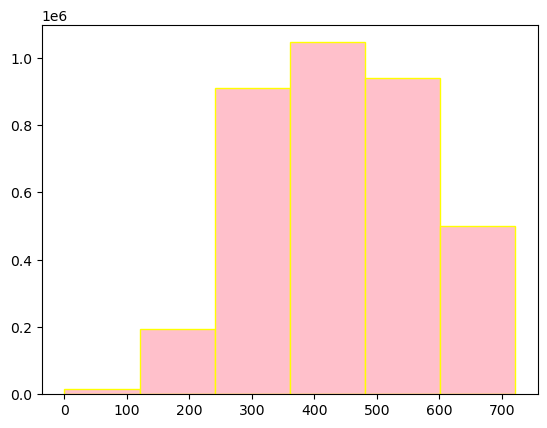

In [134]:
plt.hist(data.Actual_Shipment_Time,bins = 6, color = "pink", edgecolor = "yellow")

(array([ 13879.,   1626.,  47802., 482716., 574647., 531500., 709999.,
        555757., 490983., 195266.]),
 array([  0.        ,  72.17656065, 144.35312131, 216.52968196,
        288.70624261, 360.88280327, 433.05936392, 505.23592457,
        577.41248522, 649.58904588, 721.76560653]),
 <BarContainer object of 10 artists>)

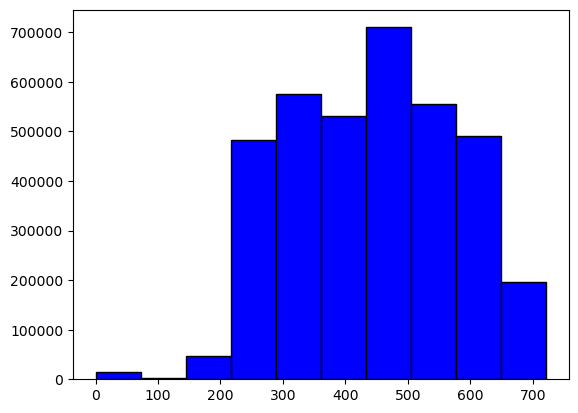

In [135]:
plt.hist(data.Actual_Shipment_Time, bins = 10, color = "blue", edgecolor = "black")


(array([ 14252.,   1112.,   1898., 224430., 309776., 441129., 301015.,
        358558., 442533., 286586., 438288., 279561., 278063., 184158.,
         42816.]),
 array([1.00000000e+00, 1.60933334e+02, 3.20866669e+02, 4.80799988e+02,
        6.40733337e+02, 8.00666687e+02, 9.60599976e+02, 1.12053333e+03,
        1.28046667e+03, 1.44040002e+03, 1.60033337e+03, 1.76026672e+03,
        1.92019995e+03, 2.08013330e+03, 2.24006665e+03, 2.40000000e+03]),
 <BarContainer object of 15 artists>)

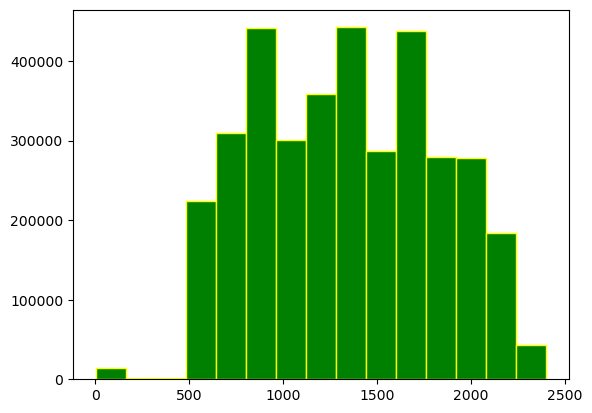

In [62]:
plt.hist(data.Actual_Shipment_Time, bins = 15, color = "green", edgecolor = "yellow")

(array([5.64800e+03, 1.02600e+03, 2.88000e+02, 4.43000e+02, 2.30840e+04,
        3.31459e+05, 2.98350e+05, 3.03737e+05, 2.82688e+05, 2.36558e+05,
        2.20946e+05, 2.98697e+05, 2.93947e+05, 2.91413e+05, 2.57473e+05,
        2.15797e+05, 2.35002e+05, 1.81005e+05, 9.75580e+04, 2.90560e+04]),
 array([   0.  ,  117.95,  235.9 ,  353.85,  471.8 ,  589.75,  707.7 ,
         825.65,  943.6 , 1061.55, 1179.5 , 1297.45, 1415.4 , 1533.35,
        1651.3 , 1769.25, 1887.2 , 2005.15, 2123.1 , 2241.05, 2359.  ]),
 <BarContainer object of 20 artists>)

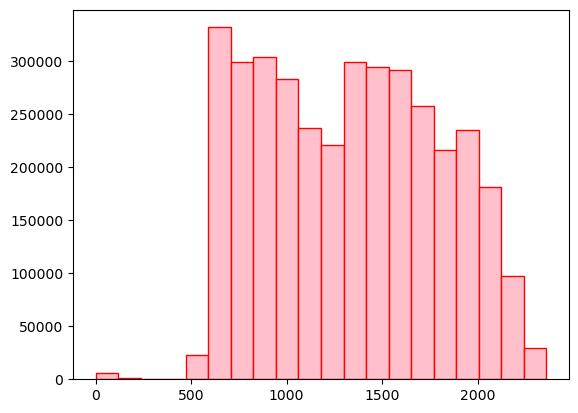

In [136]:
plt.hist(data.Planned_Shipment_Time, bins = 20, color = "pink", edgecolor = "red")

(array([ 29370.,   4033.,   1211.,    787.,   1697.,  18641.,  34611.,
        127066., 182485., 206573., 226098., 200698., 218399., 199730.,
        214995., 201168., 227877., 211781., 219466., 210580., 218017.,
        208613., 175886., 160937., 103456.]),
 array([   0.,   96.,  192.,  288.,  384.,  480.,  576.,  672.,  768.,
         864.,  960., 1056., 1152., 1248., 1344., 1440., 1536., 1632.,
        1728., 1824., 1920., 2016., 2112., 2208., 2304., 2400.]),
 <BarContainer object of 25 artists>)

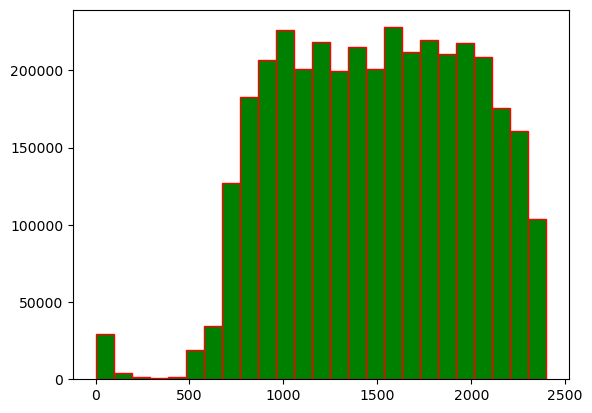

In [137]:
plt.hist(data.Planned_Delivery_Time, bins = 25, color = "green", edgecolor = "red")


(array([1.072895e+06, 6.537940e+05, 4.842980e+05, 3.255210e+05,
        2.183610e+05, 2.711180e+05, 1.769670e+05, 2.330280e+05,
        8.818300e+04, 6.385500e+04, 1.614500e+04, 2.000000e+00,
        8.000000e+00]),
 array([1.00000000e+00, 7.50230769e+02, 1.49946154e+03, 2.24869231e+03,
        2.99792308e+03, 3.74715385e+03, 4.49638462e+03, 5.24561538e+03,
        5.99484615e+03, 6.74407692e+03, 7.49330769e+03, 8.24253846e+03,
        8.99176923e+03, 9.74100000e+03]),
 <BarContainer object of 13 artists>)

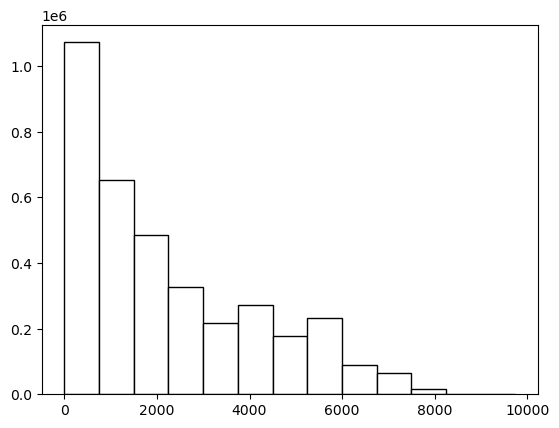

In [138]:
plt.hist(data.Carrier_Num, bins = 13, color = "white", edgecolor = "black")

(array([2.022488e+06, 1.378424e+06, 1.977270e+05, 4.721000e+03,
        8.140000e+02, 0.000000e+00, 0.000000e+00, 0.000000e+00,
        0.000000e+00, 1.000000e+00]),
 array([ -25.,  121.,  267.,  413.,  559.,  705.,  851.,  997., 1143.,
        1289., 1435.]),
 <BarContainer object of 10 artists>)

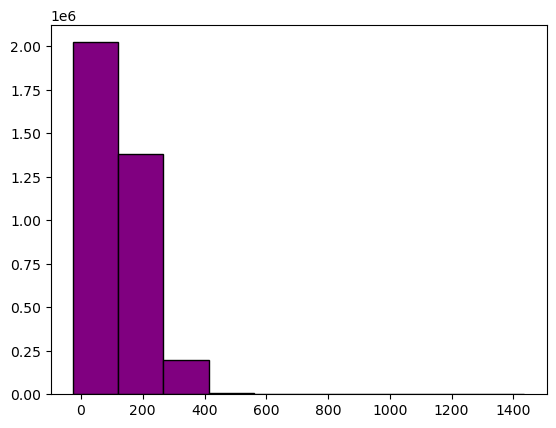

In [139]:
plt.hist(data.Planned_TimeofTravel, bins = 10, color = "purple", edgecolor = "black")

(array([3.566932e+06, 3.583700e+04, 9.980000e+02, 2.560000e+02,
        1.190000e+02, 2.600000e+01, 3.000000e+00, 2.000000e+00,
        0.000000e+00, 2.000000e+00]),
 array([ -92. ,  163.9,  419.8,  675.7,  931.6, 1187.5, 1443.4, 1699.3,
        1955.2, 2211.1, 2467. ]),
 <BarContainer object of 10 artists>)

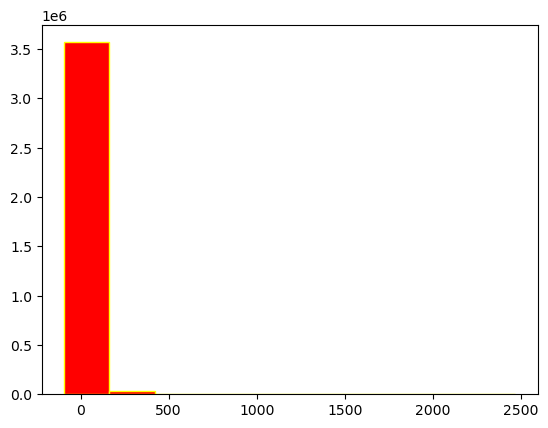

In [143]:
plt.hist(data.Shipment_Delay, bins = 10, color = "red", edgecolor = "yellow")

(array([9.965960e+05, 1.116588e+06, 6.757480e+05, 3.531370e+05,
        1.827640e+05, 1.162780e+05, 6.481500e+04, 8.189700e+04,
        1.042700e+04, 9.920000e+02, 6.830000e+02, 1.820000e+03,
        1.362000e+03, 7.040000e+02, 3.640000e+02]),
 array([  11.        ,  341.06666667,  671.13333333, 1001.2       ,
        1331.26666667, 1661.33333333, 1991.4       , 2321.46666667,
        2651.53333333, 2981.6       , 3311.66666667, 3641.73333333,
        3971.8       , 4301.86666667, 4631.93333333, 4962.        ]),
 <BarContainer object of 15 artists>)

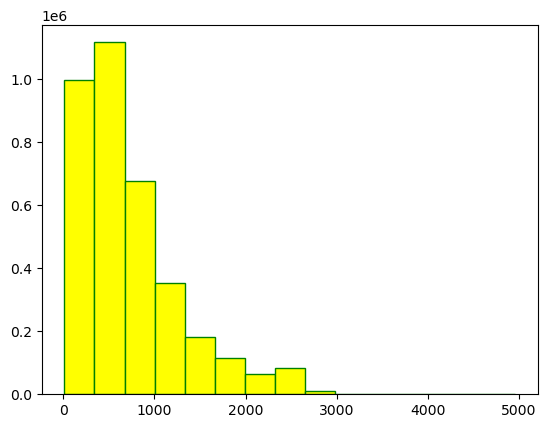

In [68]:
plt.hist(data.Distance, bins = 15, color = "yellow", edgecolor = "green")


(array([2804359.,       0.,   81602.,       0.,       0.,       0.,
              0.,       0.,       0.,  718214.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

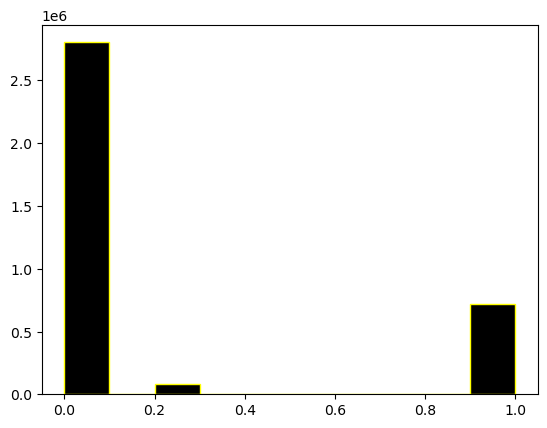

In [141]:
plt.hist(data.Delivery_Status, bins = 10, color = "black", edgecolor = "yellow")

(array([353130., 359143., 355264., 354727., 358669., 358583., 356858.,
        355273., 354755., 397773.]),
 array([ 1.,  4.,  7., 10., 13., 16., 19., 22., 25., 28., 31.]),
 <BarContainer object of 10 artists>)

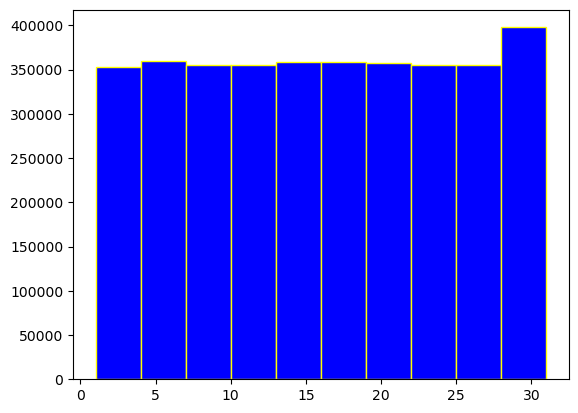

In [142]:
plt.hist(data.DayofMonth, bins = 10, color = "blue", edgecolor = "yellow")

(array([532778., 520986.,      0., 529726.,      0., 536020., 537374.,
             0., 444912., 502379.]),
 array([1. , 1.6, 2.2, 2.8, 3.4, 4. , 4.6, 5.2, 5.8, 6.4, 7. ]),
 <BarContainer object of 10 artists>)

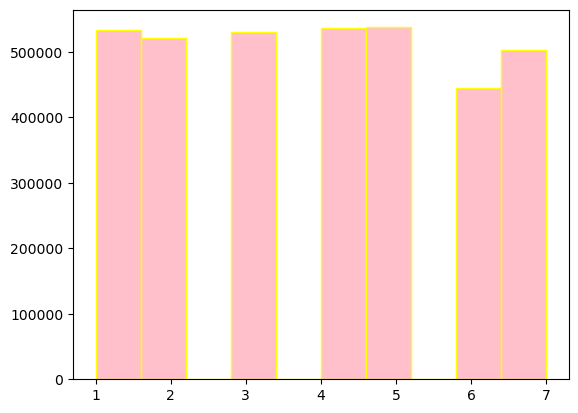

In [71]:
plt.hist(data.DayOfWeek, bins = 10, color = "pink", edgecolor = "yellow")

In [72]:
plt.show()

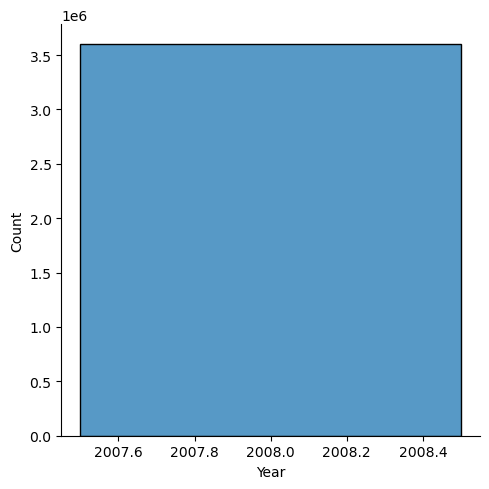

In [73]:
sns.displot(data.Year)    

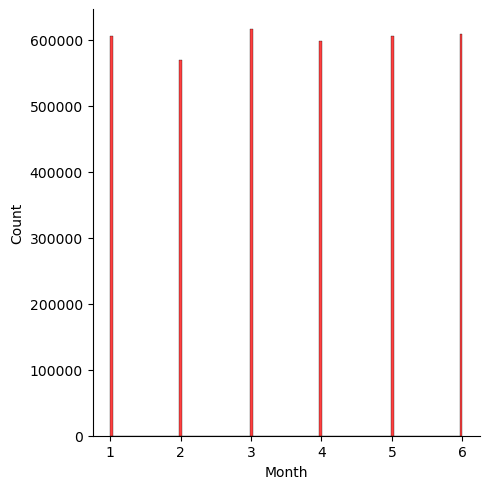

In [74]:
sns.displot(data.Month, color = "red")

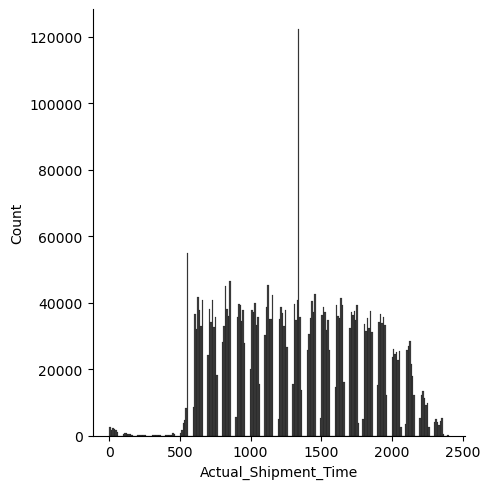

In [75]:
sns.displot(data.Actual_Shipment_Time, color = "black")

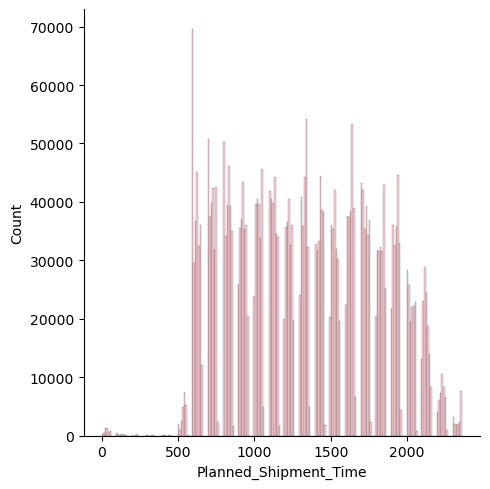

In [76]:
sns.displot(data.Planned_Shipment_Time, color = "pink")

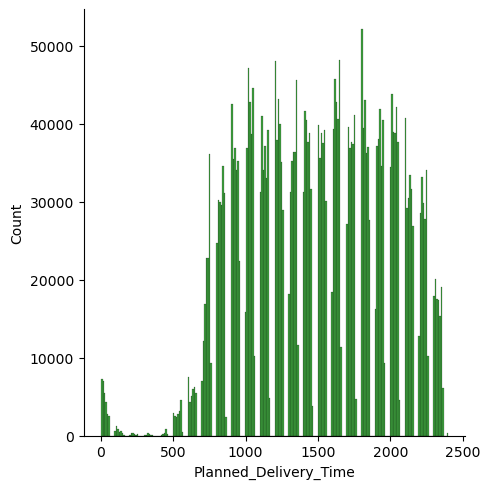

In [77]:
sns.displot(data.Planned_Delivery_Time, color = "green")

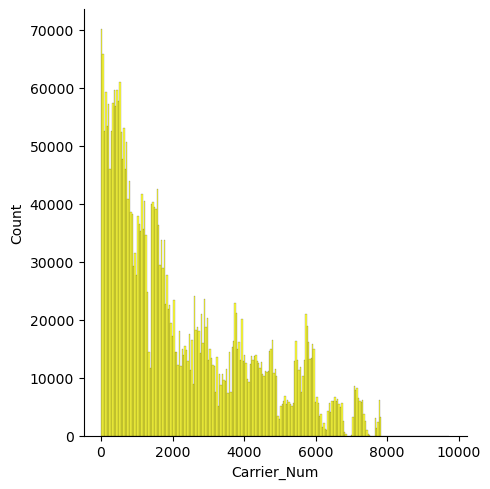

In [78]:
sns.displot(data.Carrier_Num, color = "yellow")

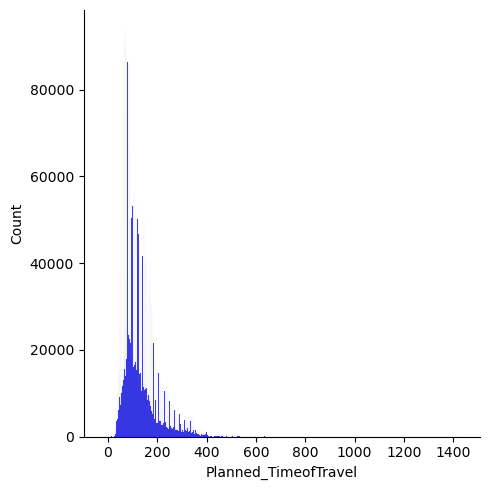

In [79]:
sns.displot(data.Planned_TimeofTravel, color = "blue")

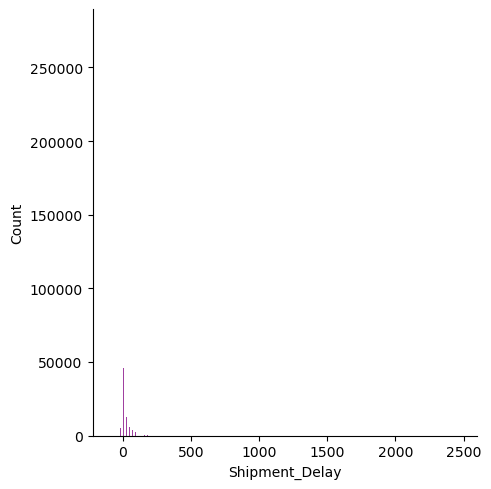

In [80]:
sns.displot(data.Shipment_Delay, color = "purple")

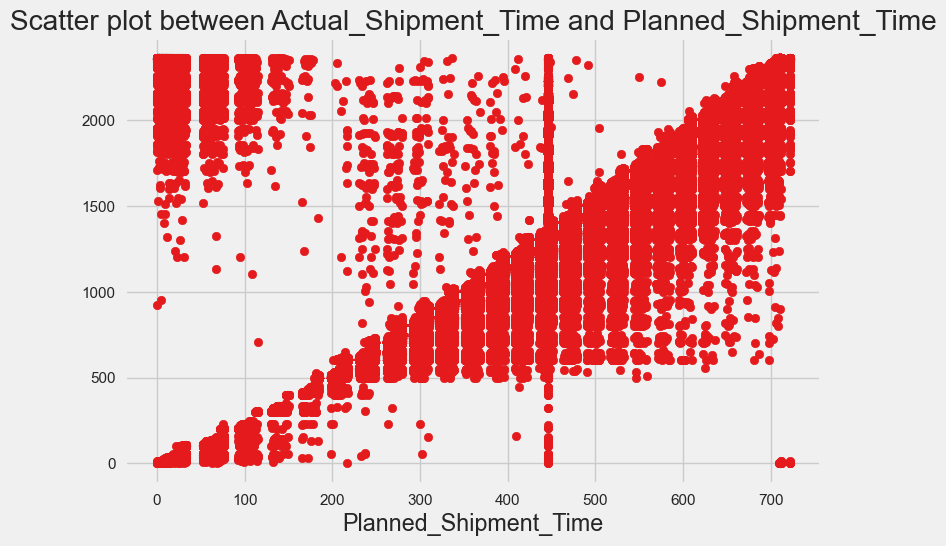

In [146]:
# creating a sctter plot between 'Actual_Shipment_Time' and 'Planned_Shipment_Time'
plt.scatter(data['Actual_Shipment_Time'], data['Planned_Shipment_Time'])
plt.xlabel('Actual_Shipment_Time')
plt.xlabel('Planned_Shipment_Time')
plt.title('Scatter plot between Actual_Shipment_Time and Planned_Shipment_Time')
plt.show()

# Auto EDA

In [144]:
# sweetviz
import sweetviz as sv
s = sv.analyze(data)
s.show_html()

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [83]:
pip install Autoviz


Note: you may need to restart the kernel to use updated packages.


In [ ]:
# Autoviz

Imported v0.1.730. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
    max_rows_analyzed is smaller than dataset shape 3604175...
        randomly sampled 150000 rows from read CSV file
Shape of your Data Set loaded: (150000, 15)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    15 Predictors classified...
        1 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['Year']
Since Number of Rows in data 150000 exceeds maximum, random

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Year,int64,0.000000,0,2008.000000,2008.000000,Zero-variance colum: drop before modeling process.
Month,int64,0.000000,0,1.000000,6.000000,No issue
DayofMonth,int64,0.000000,0,1.000000,31.000000,No issue
DayOfWeek,int64,0.000000,0,1.000000,7.000000,No issue
Actual_Shipment_Time,float64,2.262000,NA,1.000000,2400.000000,"3393 missing values. Impute them with mean, median, mode, or a constant value such as 123."
Planned_Shipment_Time,int64,0.000000,0,5.000000,2359.000000,has a high correlation with ['Actual_Shipment_Time']. Consider dropping one of them.
Planned_Delivery_Time,int64,0.000000,0,1.000000,2400.000000,No issue
Carrier_Name,object,0.000000,0,nan,nan,"2 rare categories: ['HA', 'AQ']. Group them into a single category or drop the categories."
Carrier_Num,int64,0.000000,4,1.000000,7829.000000,No issue
Planned_TimeofTravel,float64,0.012667,NA,1.000000,660.000000,"19 missing values. Impute them with mean, median, mode, or a constant value such as 123., has 6919 outliers greater than upper bound (280.00) or lower than lower bound(-40.00). Cap them or remove them."


Number of All Scatter Plots = 6


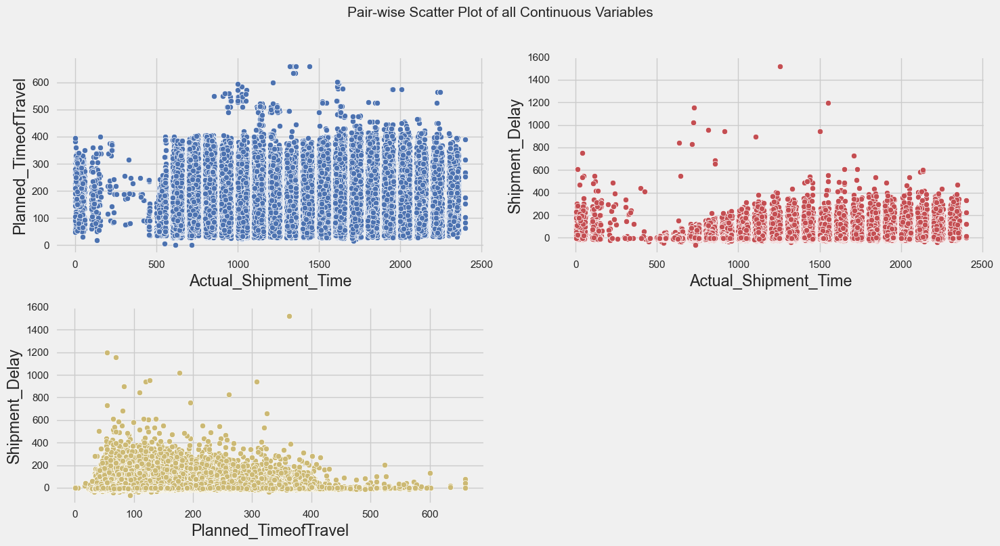

Could not draw Distribution Plot


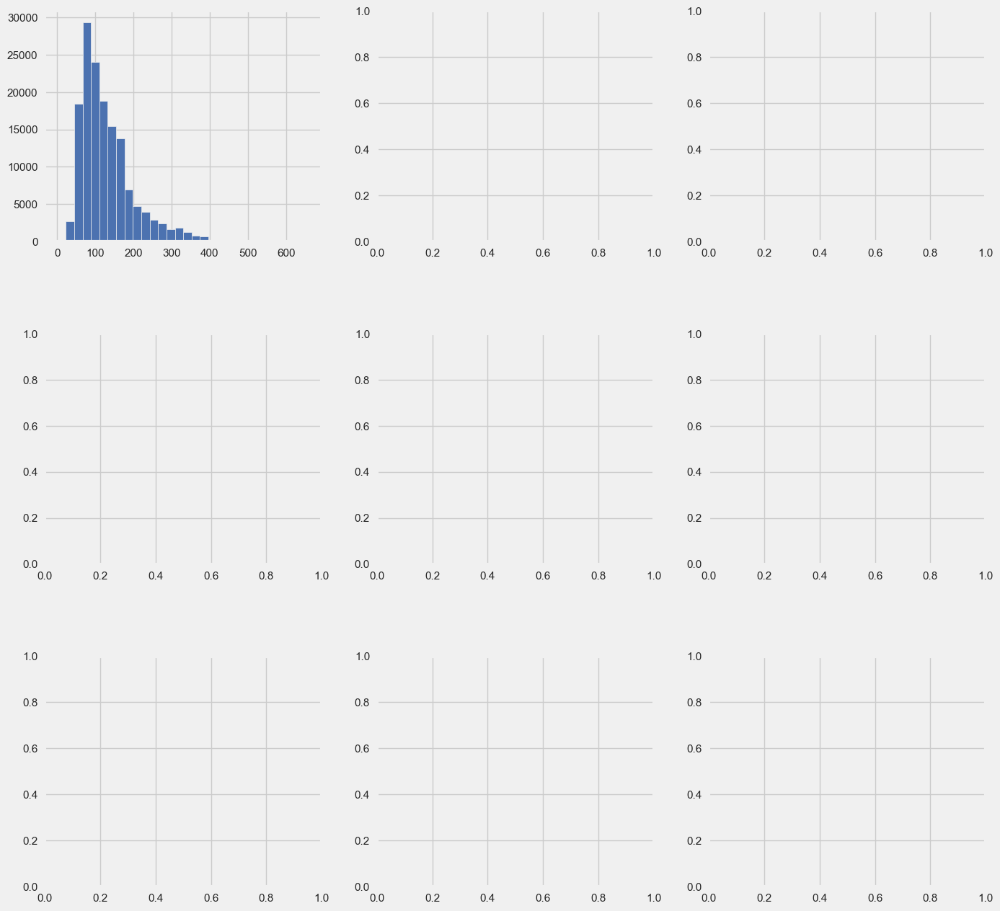

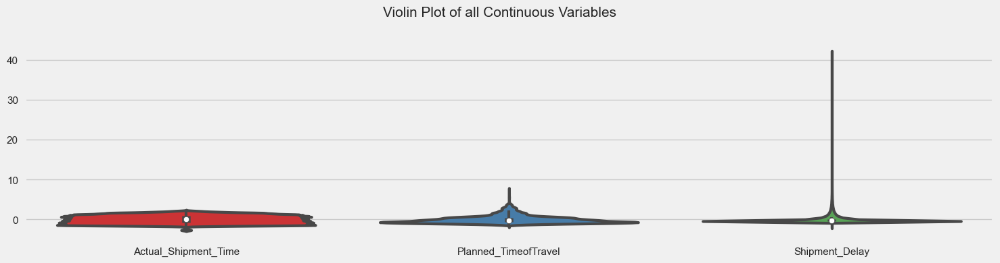

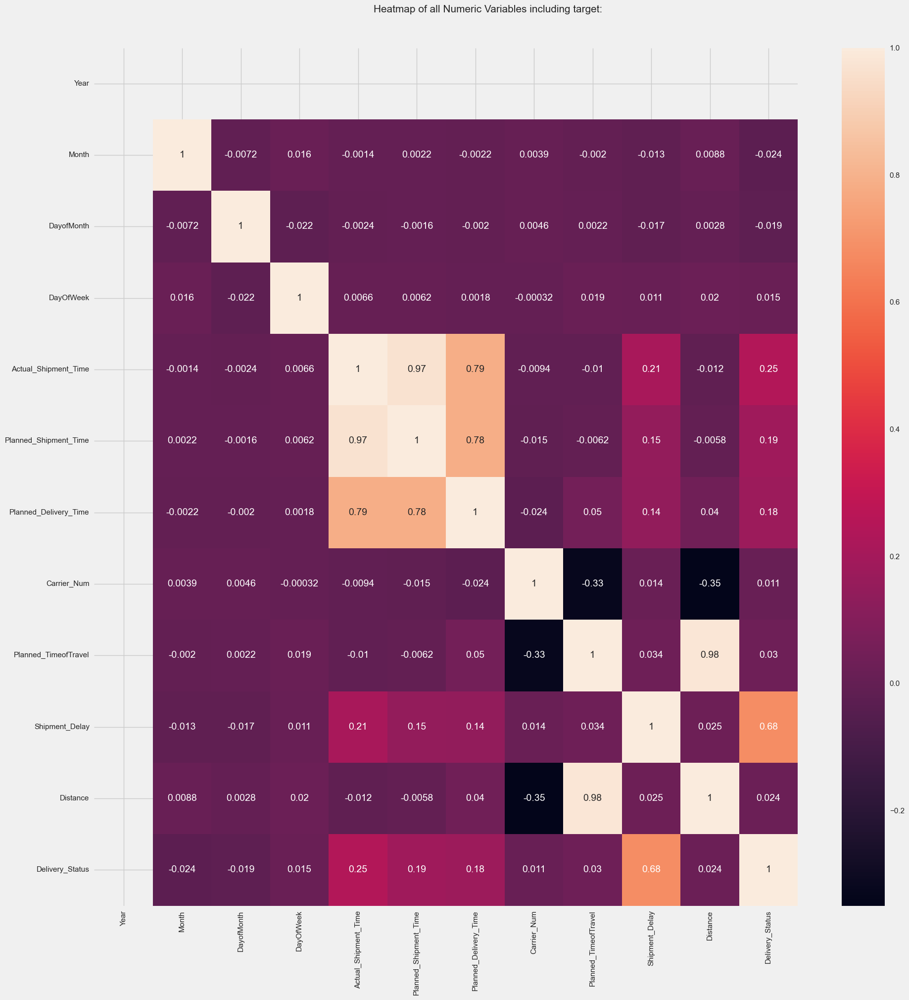

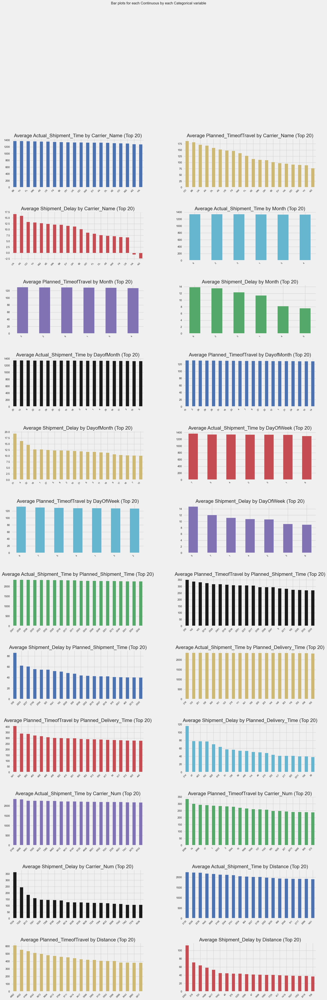

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to C:\Users\SHIVAJI
[nltk_data]    |     PATIL\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping corpora\cmudict.zip.
[nltk_data]    | Downloading package gazetteers to C:\Users\SHIVAJI
[nltk_data]    |     PATIL\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping corpora\gazetteers.zip.
[nltk_data]    | Downloading package genesis to C:\Users\SHIVAJI
[nltk_data]    |     PATIL\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping corpora\genesis.zip.
[nltk_data]    | Downloading package gutenberg to C:\Users\SHIVAJI
[nltk_data]    |     PATIL\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping corpora\gutenberg.zip.
[nltk_data]    | Downloading package inaugural to C:\Users\SHIVAJI
[nltk_data]    |     PATIL\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping corpora\inaugural.zip.
[nltk_data]    | Downloading package movie_reviews to C:\Users\SHIVA

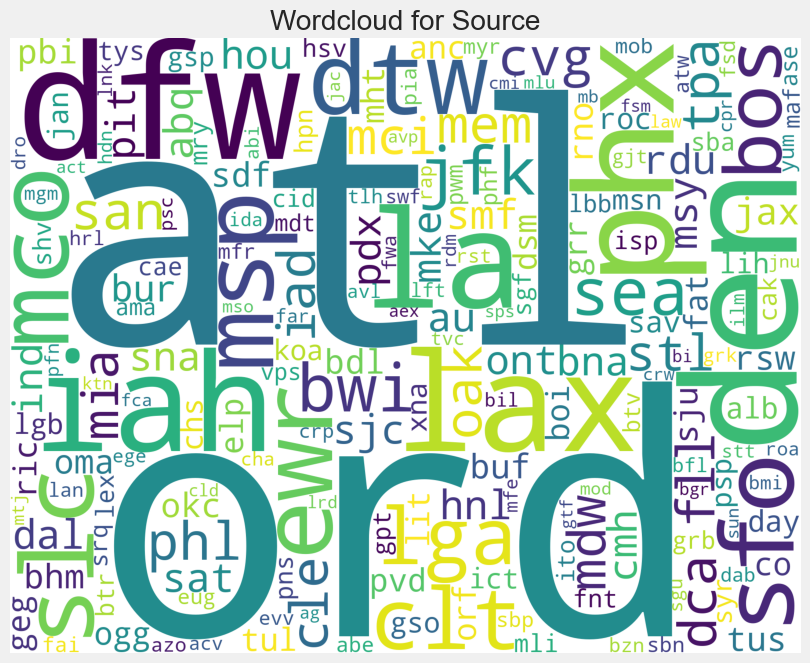

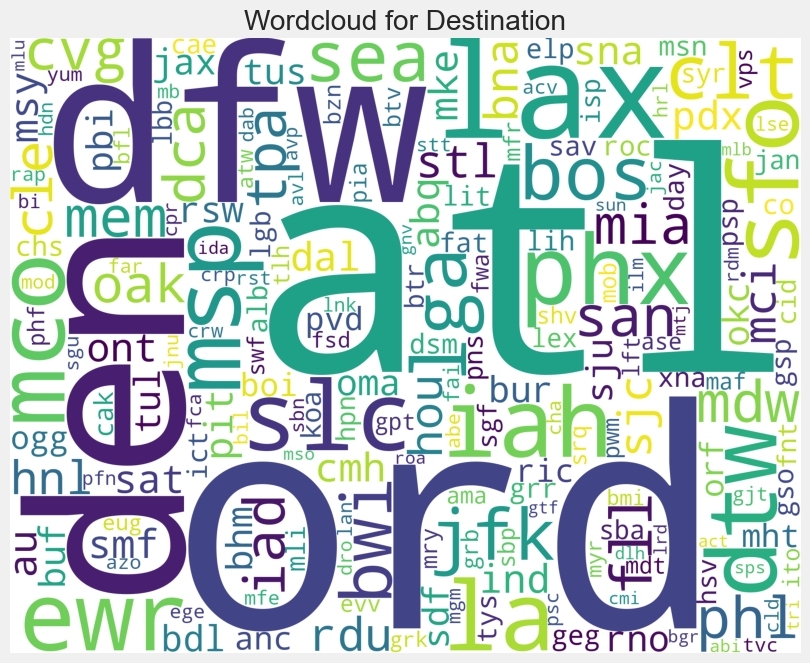

All Plots done
Time to run AutoViz = 327 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [145]:
from autoviz.AutoViz_Class import AutoViz_Class

av = AutoViz_Class()
%matplotlib inline
# a= av.AutoViz(r"fedex.csv", chart_format = 'html')
a = av.AutoViz(r"fedex.csv")

In [147]:
import dtale 
data = pd.read_csv(r"A:\class is started\EDA\project wrk\Dataset-20230916T144431Z-001\Dataset\fedex\fedex.csv")
d = dtale.show(data)
d.open_browser()


In [148]:
from pandas_profiling import ProfileReport
p =  ProfileReport(data)
p
p.to_file("output.html")
import os
os.getcwd()


2023-09-23 16:32:03,563 - INFO     - Pandas backend loaded 1.5.3
2023-09-23 16:32:03,619 - INFO     - Numpy backend loaded 1.24.3
2023-09-23 16:32:03,625 - INFO     - Pyspark backend NOT loaded
2023-09-23 16:32:03,626 - INFO     - Python backend loaded


PydanticImportError: `BaseSettings` has been moved to the `pydantic-settings` package. See https://docs.pydantic.dev/2.3/migration/#basesettings-has-moved-to-pydantic-settings for more details.

For further information visit https://errors.pydantic.dev/2.3/u/import-error